<a href="https://www.kaggle.com/code/klyushnik/5-episode?scriptVersionId=168374572" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/wine-quality-dataset/WineQT.csv
/kaggle/input/playground-series-s3e5/sample_submission.csv
/kaggle/input/playground-series-s3e5/train.csv
/kaggle/input/playground-series-s3e5/test.csv


In [2]:
train = pd.read_csv('/kaggle/input/playground-series-s3e5/train.csv')
test = pd.read_csv('/kaggle/input/playground-series-s3e5/test.csv')
sample_submission = pd.read_csv('/kaggle/input/playground-series-s3e5/sample_submission.csv')
original = pd.read_csv('/kaggle/input/wine-quality-dataset/WineQT.csv')

In [3]:
train_all = pd.concat([train, original], ignore_index=True)
train_all

,Id,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,0,8.0,0.500,0.39,2.2,0.073,30.0,39.0,0.99572,3.33,0.77,12.1,6
1,1,9.3,0.300,0.73,2.3,0.092,30.0,67.0,0.99854,3.32,0.67,12.8,6
2,2,7.1,0.510,0.03,2.1,0.059,3.0,12.0,0.99660,3.52,0.73,11.3,7
3,3,8.1,0.870,0.22,2.6,0.084,11.0,65.0,0.99730,3.20,0.53,9.8,5
4,4,8.5,0.360,0.30,2.3,0.079,10.0,45.0,0.99444,3.20,1.36,9.5,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3194,1592,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
3195,1593,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6
3196,1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
3197,1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6


In [4]:
print('Type Classifier - ',   train_all.quality.unique())

Type Classifier -  [6 7 5 4 8 3]


In [5]:
import pandas_profiling

In [6]:
pandas_profiling.ProfileReport(train)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image
%matplotlib inline

<Figure size 800x640 with 0 Axes>

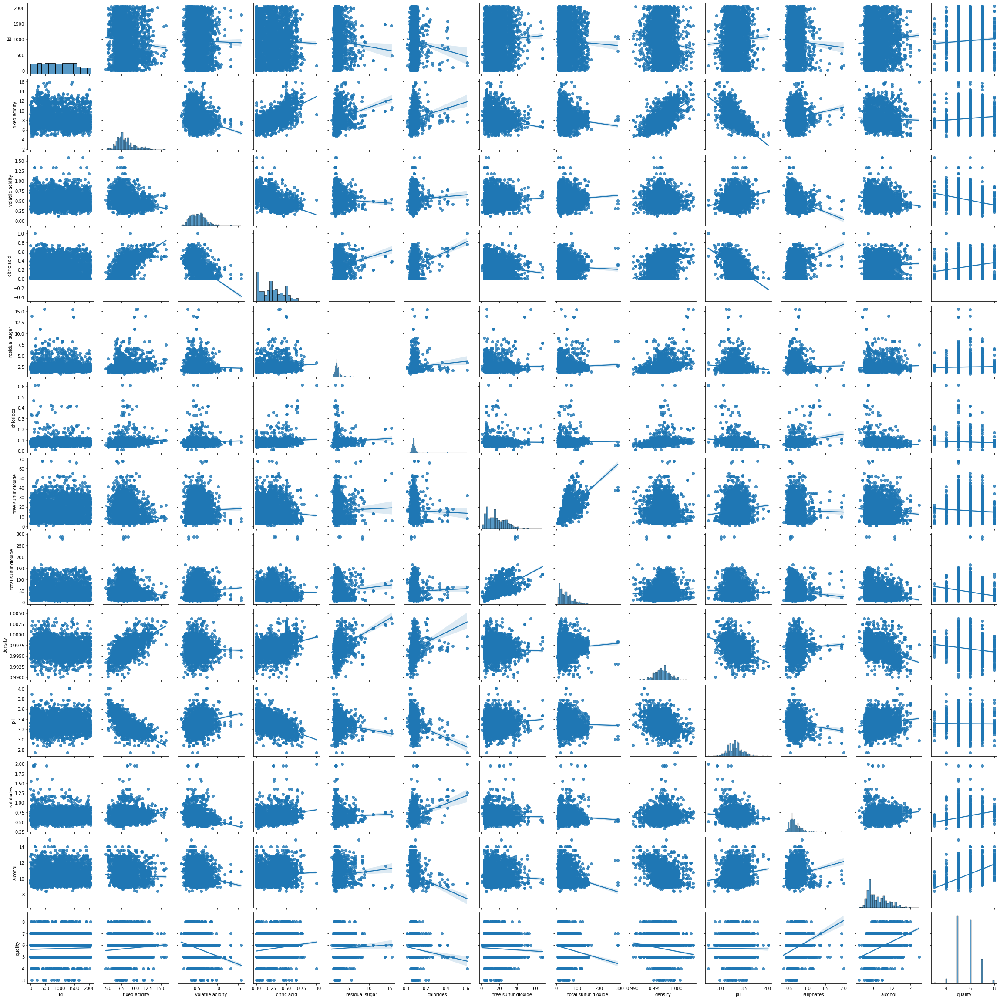

In [8]:
plt.figure(figsize=(10,8), dpi= 80)
sns.pairplot(train_all, kind="reg")
plt.show()

In [9]:
train_all['alcohol_density'] = train_all['alcohol']  * train_all['density']
train_all['sulphate/density'] = train_all['sulphates']  / train_all['density']

test['alcohol_density'] = test['alcohol']  * test['density']
test['sulphate/density'] = test['sulphates']  / test['density']

In [10]:
df_train = train_all.copy(deep =True)

df_test = test.copy(deep = True)

In [11]:
X = df_train.drop(columns = ['Id'])
y = df_train.quality

x_final = df_test.drop(columns = ['Id'])

In [12]:
X["Med_sulphates"] = X.groupby("sulphates")["density"].transform("median")
x_final["Med_sulphates"] = x_final.groupby("sulphates")["density"].transform("median")

X["Med_alcohol"] = X.groupby("alcohol")["density"].transform("median")
x_final["Med_alcohol"] = x_final.groupby("alcohol")["density"].transform("median")


In [13]:
X['log+sulphates+1'] = (X['sulphates']+1).transform(np.log)
x_final['log+sulphates+1'] = (x_final['sulphates']+1).transform(np.log)

X['log+1+density'] = (X['density']+1).transform(np.log)
x_final['log+1+density'] = (x_final['density']+1).transform(np.log)

X['log+1+alcohol'] = (X['alcohol']+1).transform(np.log)
x_final['log+1+alcohol'] = (x_final['alcohol']+1).transform(np.log)

In [14]:
X['normalized_sulphates'] = (X['sulphates'] - X['sulphates'].min()) / (X['sulphates'].max() - X['sulphates'].min())
x_final['normalized_sulphates'] = (x_final['sulphates'] - x_final['sulphates'].min()) / (x_final['sulphates'].max() - x_final['sulphates'].min())

X['normalized_alcohol_density'] = (X['alcohol_density'] - X['alcohol_density'].min()) / (X['alcohol_density'].max() - X['alcohol_density'].min())
x_final['normalized_alcohol_density'] = (x_final['alcohol_density'] - x_final['alcohol_density'].min()) / (x_final['alcohol_density'].max() - x_final['alcohol_density'].min())


X['normalized_total sulfur dioxide'] = (X['total sulfur dioxide'] - X['total sulfur dioxide'].min()) / (X['total sulfur dioxide'].max() - X['total sulfur dioxide'].min())
x_final['normalized_total sulfur dioxide'] = (x_final['total sulfur dioxide'] - x_final['total sulfur dioxide'].min()) / (x_final['total sulfur dioxide'].max() - x_final['total sulfur dioxide'].min())

In [15]:
X['standardized_sulphates'] = (X['sulphates'] - X['sulphates'].mean()) / X['sulphates'].std()
x_final['standardized_sulphates'] = (x_final['sulphates'] - x_final['sulphates'].mean()) / x_final['sulphates'].std()

X['standardized_alcohol_density'] = (X['alcohol_density'] - X['alcohol_density'].mean()) / X['alcohol_density'].std()
x_final['standardized_alcohol_density'] = (x_final['alcohol_density'] - x_final['alcohol_density'].mean()) / x_final['alcohol_density'].std()

X['standardized_alcohol'] = (X['alcohol'] - X['alcohol'].mean()) / X['alcohol'].std()
x_final['standardized_alcohol'] = (x_final['alcohol'] - x_final['alcohol'].mean()) / x_final['alcohol'].std()

In [16]:
X_col = X.drop(columns = ['quality'])

In [17]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_col, y, train_size=0.45, random_state=42)

In [18]:
import os
np.set_printoptions(precision=4)
import catboost
from catboost import *
from catboost import CatBoostClassifier
from catboost.utils import get_roc_curve
import sklearn
from sklearn import metrics

In [19]:
model = CatBoostClassifier(
    iterations=400,
    random_seed=43,
    loss_function='MultiClass'
)

model.fit(
    X_train, y_train,
    eval_set=(X_test, y_test),
    verbose=False,
    #plot=True
)

In [20]:
model.get_feature_importance(prettified=True)

,Feature Id,Importances
0,standardized_sulphates,7.443894
1,alcohol,6.354158
2,sulphate/density,6.190881
3,Med_sulphates,5.976269
4,sulphates,5.629463
5,normalized_sulphates,5.117426
6,pH,4.862240
7,total sulfur dioxide,4.789209
8,volatile acidity,4.777886
9,residual sugar,4.625826


In [21]:
 cat = CatBoostClassifier(
    random_seed=63,
    iterations=int(model.tree_count_ * 1.2)
)

cat.fit(
    X_train, y_train,
    eval_set=(X_test, y_test),
    verbose=100
)

Learning rate set to 0.32936
0:	learn: 1.3842251	test: 1.4129314	best: 1.4129314 (0)	total: 16.1ms	remaining: 870ms
54:	learn: 0.5551240	test: 1.0479209	best: 1.0227184 (25)	total: 517ms	remaining: 0us

bestTest = 1.022718426
bestIteration = 25

Shrink model to first 26 iterations.


In [22]:
pred_1 = cat.predict(x_final)

In [23]:
pred_1 = cat.predict(x_final)

In [24]:
sample_submission['quality'] = pred_1

In [25]:
sample_submission.head()

,Id,quality
0,2056,6
1,2057,6
2,2058,5
3,2059,6
4,2060,6


In [26]:
sample_submission.to_csv('submission.csv', index=False)